In [1]:
from collections import Counter
import json
from operator import itemgetter
import os 
import random
import sys
import time

In [2]:
from annoy import AnnoyIndex
import matplotlib.pyplot as plt
import numpy as np
from pycocotools.coco import COCO
from skimage import io
import torch

In [3]:
os.chdir('../')
sys.path.append("../utils/")
from plot_utils import EmbeddingPlotter as ep

In [4]:
sys.path.append('../dataset/')
import coco_api_helper

loading annotations into memory...
Done (t=11.86s)
creating index...
index created!
loading annotations into memory...
Done (t=6.42s)
creating index...
index created!
loading annotations into memory...
Done (t=0.12s)
creating index...
index created!


### Global Variables

In [5]:
annot_file = "../data/raw/train/annotations/instances_val2014.json"

In [6]:
val_coco = coco_api_helper.coco_objects['valid']

In [7]:
category_id2name = {cat['id']: cat['name'] for cat in val_coco.loadCats(val_coco.getCatIds())}

### Load Embeddings

In [8]:
embeddings_fp = "../data/torch_embeddings/densenet_inspired"
embeddings_path = f"{embeddings_fp}/di_embed_val_batch_41.pt"
mapping_path = f"{embeddings_fp}/di_index2cocoIDs.json"

In [9]:
embeddings = torch.load(embeddings_path, map_location=torch.device('cpu'))

with open(mapping_path, 'r') as fp:
    idx2Img = json.load(fp)
    
idx2Img = dict(zip(list(map(int, idx2Img.keys())), list(idx2Img.values())))

### Query IDs and Indexes

In [10]:
# Img Ids to query
random.seed(10)
query_images = random.sample(list(idx2Img.values()), 10)

# Position of query images in embedding space
query_idxs = [key for key, value in idx2Img.items() if idx2Img[key] in query_images]

print("query image ids: ", query_images)
print("query image idxs: ", query_idxs)

query image ids:  [495291, 100582, 547338, 223243, 87414, 78915, 38210, 70280, 455188, 263723]
query image idxs:  [486, 1067, 6753, 9093, 14053, 15157, 15812, 16098, 18723, 18942]


### Build ANNOY Search

In [11]:
embeddings.shape[1]

1024

In [12]:
# Length of item vector that will be indexed
f = embeddings.shape[1]

t = AnnoyIndex(f, 'angular')  
for i in range(len(embeddings)):
    t.add_item(i, embeddings[i])

t.build(10)

True

In [13]:
t.save('test.ann')

# ...

u = AnnoyIndex(f, 'angular')
u.load('test.ann')

True

In [14]:
# index 0 for each of the child lists is the query index
# the subsequent 4 indices are the approx. nearest neighbors
sim_embeddings = [u.get_nns_by_item(idx, 11) for idx in query_idxs]
sim_embeddings

[[486, 16150, 7290, 11278, 16430, 1422, 18820, 9001, 12933, 13586, 15183],
 [1067, 3701, 14851, 14167, 15303, 18919, 12824, 18573, 1618, 4055, 8696],
 [6753, 6211, 6, 9522, 7879, 19368, 14354, 9402, 12717, 350, 9503],
 [9093, 3808, 15335, 18550, 15333, 18453, 14831, 15336, 8075, 19405, 373],
 [14053, 12931, 18841, 1279, 9880, 8874, 19742, 16738, 1037, 8446, 621],
 [15157, 17674, 20867, 14655, 7898, 11411, 2514, 9432, 14344, 1373, 13667],
 [15812, 9212, 8947, 18629, 4762, 17442, 1713, 5364, 5944, 17901, 778],
 [16098, 8165, 10205, 12844, 9953, 13290, 13090, 18433, 20629, 17790, 15867],
 [18723, 20267, 8195, 9463, 11778, 7767, 5611, 13666, 15809, 17608, 18618],
 [18942, 14876, 11836, 17377, 12894, 17967, 16402, 11583, 20460, 17957, 17903]]

In [28]:
# Convert these embedding indices to coco Img IDS
coco_ids = [[idx2Img.get(ind) for ind in s] for s in sim_embeddings]
# coco_ids

In [30]:
coco_urls = [[val_coco.loadImgs(c)[0]['coco_url'] for c in cids] for cids in coco_ids]
coco_urls[1]

['http://images.cocodataset.org/val2014/COCO_val2014_000000100582.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000451683.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000452846.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000398548.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000494077.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000295668.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000074139.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000386841.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000075636.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000370170.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000377282.jpg']

#### Query Images
- First image (far left) 
- Similar images retrieved from ANNOY

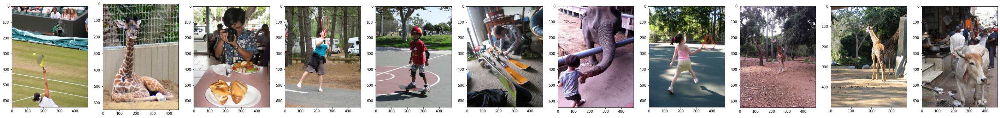

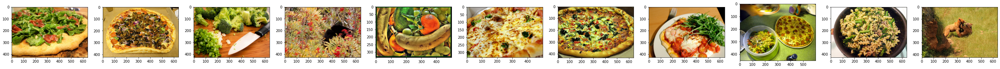

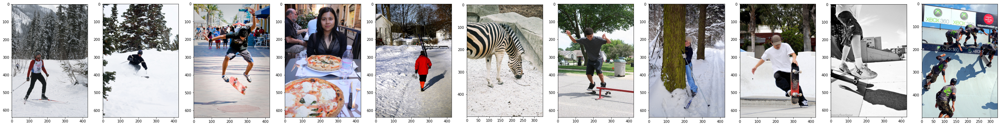

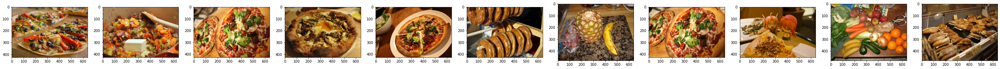

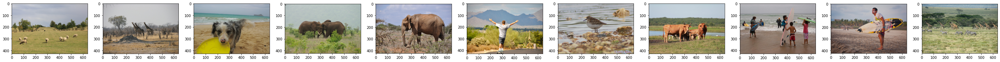

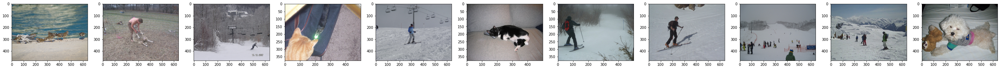

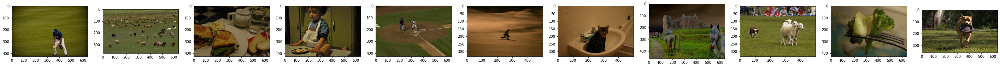

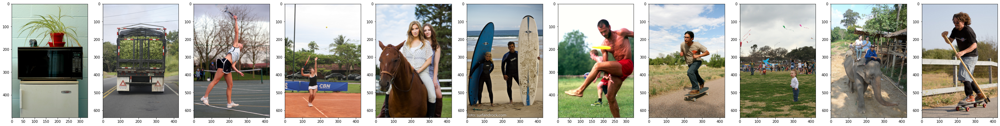

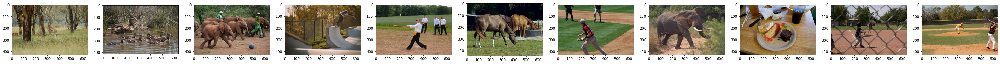

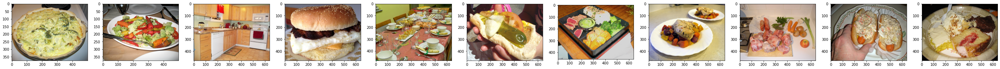

In [18]:
for j in range(len(coco_urls)):
    fig = plt.figure(1, figsize=(50, 10))

    for i, img_url in enumerate(coco_urls[j]):
        fig.add_subplot(1, len(coco_urls[0]), i+1)
        img = io.imread(img_url)
        plt.imshow(img)
    
    plt.show()

### Precision & Recall for ANNOY (DenseNet Inspired Embeddings)

In [31]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [32]:
%autoreload

In [33]:
import performance_metrics

In [35]:
# returns category precision @ k = 4
# returns supercategory precision @ k = 4
annoy_prec = [performance_metrics.annoy_precision(u, idx, idx2Img) for idx in query_idxs]
annoy_prec

[(0.2, 0.2),
 (0.0, 0.0),
 (0.3, 0.3),
 (0.1, 0.3),
 (0.0, 0.3),
 (0.0, 0.2),
 (0.0, 0.0),
 (0.0, 0.0),
 (0.0, 0.2),
 (0.0, 0.2)]

In [36]:
indices_to_get = [1, 2, -2]

In [37]:
# returns category precision @ k = 4
# returns supercategory precision @ k = 4
annoy_avg_prec = np.mean([annoy_prec[i] for i in indices_to_get], axis=0)
annoy_avg_prec

array([0.1       , 0.16666667])

In [38]:
annoy_rec = [performance_metrics.annoy_recall(u, idx, idx2Img) for idx in query_idxs]
annoy_rec

[(0.5, 0.5),
 (0.0, 0.0),
 (0.5, 0.5),
 (1.0, 0.375),
 (0, 0.6),
 (0, 0.6666666666666666),
 (0, 0),
 (0, 0),
 (0, 0.5),
 (0, 0.4)]

In [39]:
# returns category precision @ k = 4
# returns supercategory precision @ k = 4
annoy_avg_recall = np.mean([annoy_rec[i] for i in indices_to_get], axis=0)
annoy_avg_recall

array([0.16666667, 0.33333333])